# Merge Papers and Abstracts Pipeline

This notebook merges paper metadata from `ss_aws.db` with abstracts from `ss_abstracts.db` into a unified database for analysis. The merged data is then used to generate wordcloud visualizations showing research trends across fields and time periods.

**Input Databases:**
- `ss_aws.db` - Paper metadata (title, publication date, citations, field of study) (created in `get_semantic_scholar_papers.ipynb` file)
- `ss_abstracts.db` - Paper abstracts with external IDs (created in `get_semantic_scholar_abstratcs.ipynb` file)

**Output:**
- `S2_papers.db` - Merged database with papers and their abstracts
- Wordcloud visualizations for top papers by field and decade

In [1]:
import pandas as pd
import duckdb
import os
import time

## 1. Database Setup

Initialize DuckDB connections to the papers and abstracts databases, and create the output merged database.

In [ ]:
DB_DIR = 'db'
if not os.path.exists(DB_DIR):
    os.makedirs(DB_DIR)

S2_PAPERS_DB = 'db/ss_aws.db' #  Semantic Scholar Papers DB
S2_ABSTRACTS_DB = 'db/ss_abstracts.db' #  Semantic Scholar Abstracts DB

MERGED_DB = 'db/S2_papers.db' # output merged DB

papers_conn = duckdb.connect(S2_PAPERS_DB, read_only=True)
abstracts_conn = duckdb.connect(S2_ABSTRACTS_DB, read_only=True)
merged_conn = duckdb.connect(MERGED_DB)

## 2. Attach and Analyze Databases

Attach both source databases to the merged connection for easy querying and analyze the intersection of papers with available abstracts.

In [5]:
# Attach both databases to merged_conn for easy querying
merged_conn.execute(f"ATTACH '{S2_PAPERS_DB}' AS papers_db")
merged_conn.execute(f"ATTACH '{S2_ABSTRACTS_DB}' AS abstracts_db")


In [6]:
# count intersection of corpusid matches between the two dbs. tables: papers and abstracts
result = merged_conn.execute("""
    SELECT 
        COUNT(DISTINCT p.corpusid) as matching_corpusids,
        (SELECT COUNT(*) FROM papers_db.papers) as total_papers,
        (SELECT COUNT(*) FROM abstracts_db.abstracts) as total_abstracts
    FROM papers_db.papers p
    INNER JOIN abstracts_db.abstracts a
    ON CAST(p.corpusid AS VARCHAR) = CAST(a.corpusid AS VARCHAR)
""").df()

print("Intersection Analysis:")
print(f"Papers with abstracts: {result['matching_corpusids'].iloc[0]:,}")
print(f"Total papers: {result['total_papers'].iloc[0]:,}")
print(f"Total abstracts: {result['total_abstracts'].iloc[0]:,}")
print(f"Coverage: {result['matching_corpusids'].iloc[0] / result['total_papers'].iloc[0] * 100:.2f}%")

Intersection Analysis:
Papers with abstracts: 8,043,394
Total papers: 43,337,660
Total abstracts: 8,043,394
Coverage: 18.56%


## 3. Create Merged Table

Perform an inner join on `corpusid` to create the merged `papers_with_abstracts` table containing paper metadata and abstract text.

In [8]:
# create a table in merged_conn by doing inner join and all columns from both tables (match on corpusid)
_tik = time.time()
merged_conn.execute("""
    CREATE TABLE IF NOT EXISTS papers_with_abstracts AS
    SELECT 
        p.corpusid,
        p.title,
        p.publication_date,
        p.citation_count,
        p.influential_citation_count,
        p.field_of_study,
        a.externalids,
        a.abstract
    FROM papers_db.papers p
    INNER JOIN abstracts_db.abstracts a
    ON CAST(p.corpusid AS VARCHAR) = CAST(a.corpusid AS VARCHAR)
""")
print(f'created a merged table in {time.time() - _tik} seconds')


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

created a merged table in 646.1067712306976 seconds


In [9]:
# Verify the table was created
row_count = merged_conn.execute("SELECT COUNT(*) FROM papers_with_abstracts").fetchone()[0]
print(f"Created table 'papers_with_abstracts' with {row_count:,} rows")


Created table 'papers_with_abstracts' with 8,043,394 rows


## 4. Data Exploration

Examine sample records from the merged table, including influential papers and records with missing data.

In [4]:

# inflential papers
print("\nSample data:")
merged_conn.execute("SELECT * FROM papers_with_abstracts where influential_citation_count > 100").df()


Sample data:


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,corpusid,title,publication_date,citation_count,influential_citation_count,field_of_study,externalids,abstract
0,102481180,What Is Wrong With Scene Text Recognition Mode...,2019-04-03,520,110,Computer Science,"{""Medline"": null, ""MAG"": ""3004846386"", ""ACL"": ...",Many new proposals for scene text recognition ...
1,235593404,BARTScore: Evaluating Generated Text as Text G...,2021-06-22,954,147,Computer Science,"{""Medline"": null, ""MAG"": null, ""ACL"": null, ""D...","A wide variety of NLP applications, such as ma..."
2,18976515,The building blocks of economic complexity,2009-06-30,2714,361,"Economics, Medicine, Physics","{""Medline"": ""19549871v1"", ""MAG"": ""1966402429"",...","For Adam Smith, wealth was related to the divi..."
3,8229065,Learning from Simulated and Unsupervised Image...,2016-12-22,1856,126,Computer Science,"{""Medline"": null, ""MAG"": ""2952625387"", ""ACL"": ...","With recent progress in graphics, it has becom..."
4,14832074,Improving neural networks by preventing co-ada...,2012-07-02,7877,714,Computer Science,"{""Medline"": null, ""MAG"": ""1904365287"", ""ACL"": ...",When a large feedforward neural network is tra...
...,...,...,...,...,...,...,...,...
6836,271212307,Qwen2 Technical Report,2024-07-15,1568,207,"Computer Science, Linguistics, Mathematics","{""Medline"": null, ""MAG"": null, ""ACL"": null, ""D...","This report introduces the Qwen2 series, the l..."
6837,7675511,Web Service Modeling Ontology,2005-01-01,1377,127,Computer Science,"{""Medline"": null, ""MAG"": ""1714132059"", ""ACL"": ...","The potential to achieve dynamic, scalable and..."
6838,7228830,Adversarial Examples for Evaluating Reading Co...,2017-07-23,1662,151,Computer Science,"{""Medline"": null, ""MAG"": ""2952103999"", ""ACL"": ...",Standard accuracy metrics indicate that readin...
6839,231737925,"VirSorter2: a multi-classifier, expert-guided ...",2021-02-01,878,165,"Biology, Computer Science, Environmental Scien...","{""Medline"": ""33522966v1"", ""MAG"": null, ""ACL"": ...",Viruses are a significant player in many biosp...


In [12]:
# missing dates
merged_conn.execute("SELECT * FROM papers_with_abstracts where publication_date is NULL").df()

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,corpusid,title,publication_date,citation_count,influential_citation_count,field_of_study,externalids,abstract
0,9282445,Towards a Standard-based Domain-specific Platf...,None,20,0,Computer Science,"{""Medline"": null, ""MAG"": ""2240167218"", ""ACL"": ...",Machine learning is one of the most important ...
1,28381128,Analysing Course Evaluations and Exam Grades a...,None,4,0,"Computer Science, Education, Psychology","{""Medline"": null, ""MAG"": ""199182592"", ""ACL"": n...",Course evaluation data from courses at higher ...
2,202770048,Rule-Based Approach for Constrained Motion Con...,None,6,0,"Computer Science, Engineering","{""Medline"": null, ""MAG"": ""2970626496"", ""ACL"": ...",This paper presents a preliminary robotic solu...
3,268143524,LSSMA: Lightweight Spectral–Spatial Neural Arc...,None,9,0,"Computer Science, Engineering, Environmental S...","{""Medline"": null, ""MAG"": null, ""ACL"": null, ""D...",Deep learning has been utilized for hyperspect...
4,4398648,"A Multi-Objective, Risk-based Approach for Sel...",None,2,0,Computer Science,"{""Medline"": null, ""MAG"": ""2794440190"", ""ACL"": ...",In iterative and incremental development appro...
...,...,...,...,...,...,...,...,...
464265,69262085,A Study of using AHP Method to Evaluate the Cr...,None,16,0,"Computer Science, Engineering, History","{""Medline"": null, ""MAG"": ""2902584015"", ""ACL"": ...",This paper examines the criteria and attribute...
464266,234172197,Machine Learning Based Intrusion Detection Sys...,None,1,0,"Computer Science, Engineering","{""Medline"": null, ""MAG"": ""3134538926"", ""ACL"": ...",Machine learning-based intrusion detection sys...
464267,226534396,Child Location Tracker with Virtual Fence,None,0,0,"Computer Science, Education, Psychology","{""Medline"": null, ""MAG"": ""3083942019"", ""ACL"": ...",With widespread news of child abductions circu...
464268,215705792,ERRATUM,None,0,0,"Medicine, Psychology","{""Medline"": ""27849295v1"", ""MAG"": null, ""ACL"": ...",[This corrects the article doi: 10.1590/S01518...


## 5. Visualization Setup

Configure output directory and install required NLP libraries for text processing.

In [ ]:
VIZ_DIR = 'viz'
if not os.path.exists(VIZ_DIR):
    os.makedirs(VIZ_DIR)
    print(f"Visualizations will be saved to: {VIZ_DIR}/")

In [ ]:
import nltk
from nltk.corpus import stopwords as nltk_stopwords
from nltk import pos_tag, word_tokenize

# Download required NLTK data
try:
    nltk.data.find('tokenizers/punkt')
except LookupError:
    nltk.download('punkt')
try:
    nltk.data.find('averaged_perceptron_tagger')
except LookupError:
    nltk.download('averaged_perceptron_tagger')
try:
    nltk.data.find('corpora/stopwords')
except LookupError:
    nltk.download('stopwords')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/chaudharyl/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


## 6. Generate Wordclouds

Create wordcloud visualizations for paper titles and abstracts across different fields (Computer Science, Psychology, Physics) and time periods (2000-2025 in 5-year intervals). Only the top 1000 most-cited papers per field/period are included to capture research trends among impactful work.

Fetching data for wordclouds...
Processing Computer Science - 2000-2005


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  Saved: viz/wordcloud_Computer_Science_2000-2005_top1000.png


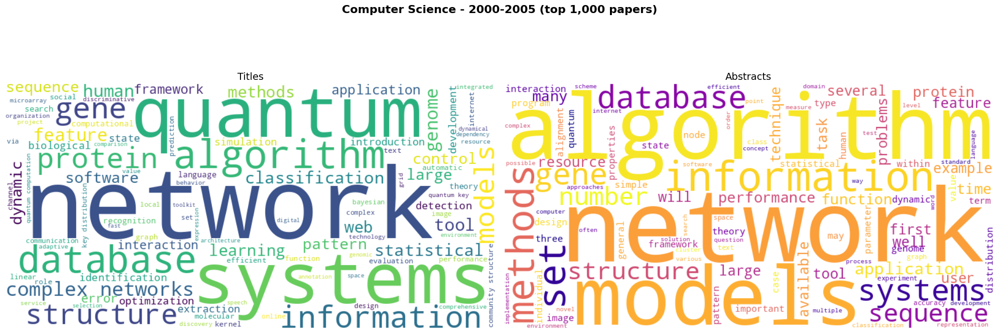

Processing Computer Science - 2005-2010


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  Saved: viz/wordcloud_Computer_Science_2005-2010_top1000.png


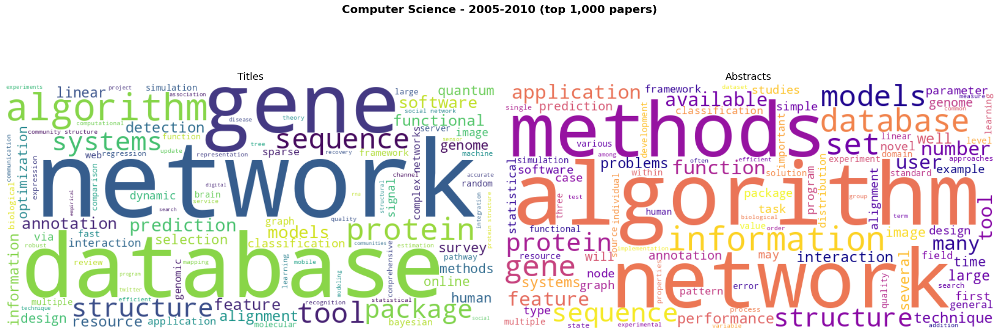

Processing Computer Science - 2010-2015


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  Saved: viz/wordcloud_Computer_Science_2010-2015_top1000.png


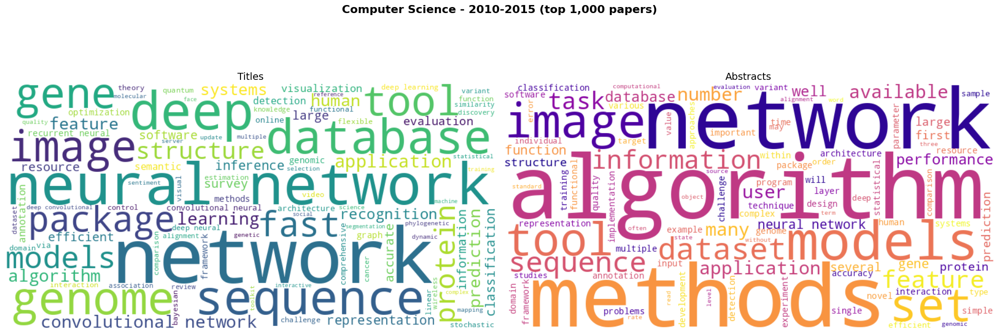

Processing Computer Science - 2015-2020


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  Saved: viz/wordcloud_Computer_Science_2015-2020_top1000.png


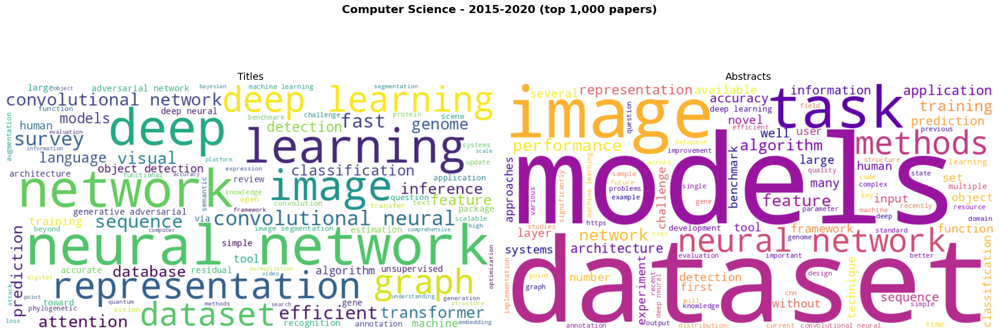

Processing Computer Science - 2020-2025


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  Saved: viz/wordcloud_Computer_Science_2020-2025_top1000.png


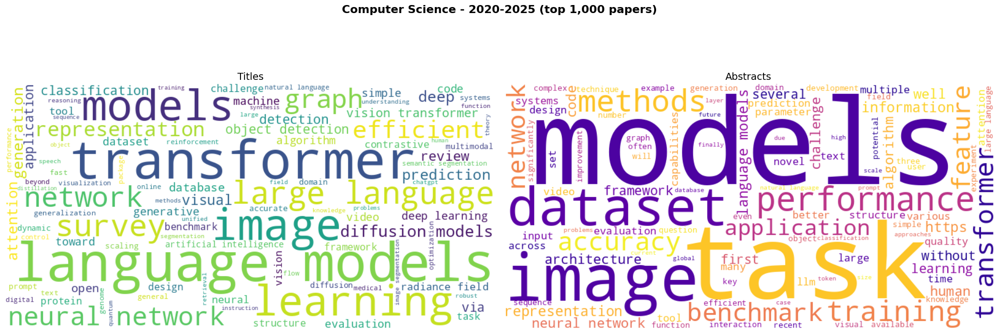

Processing Psychology - 2000-2005


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  Saved: viz/wordcloud_Psychology_2000-2005_top1000.png


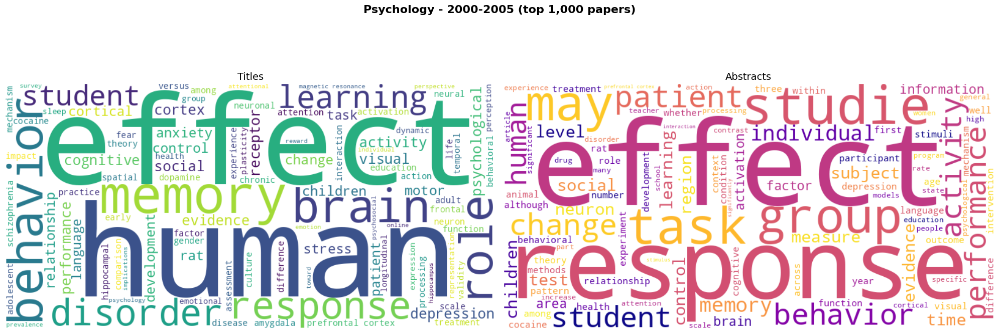

Processing Psychology - 2005-2010


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  Saved: viz/wordcloud_Psychology_2005-2010_top1000.png


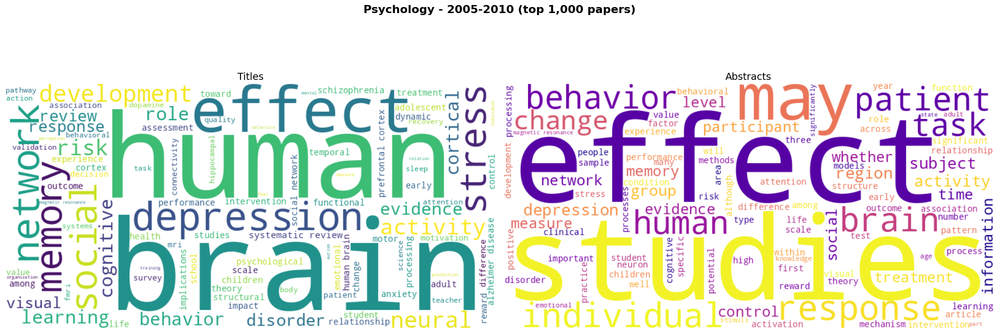

Processing Psychology - 2010-2015


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  Saved: viz/wordcloud_Psychology_2010-2015_top1000.png


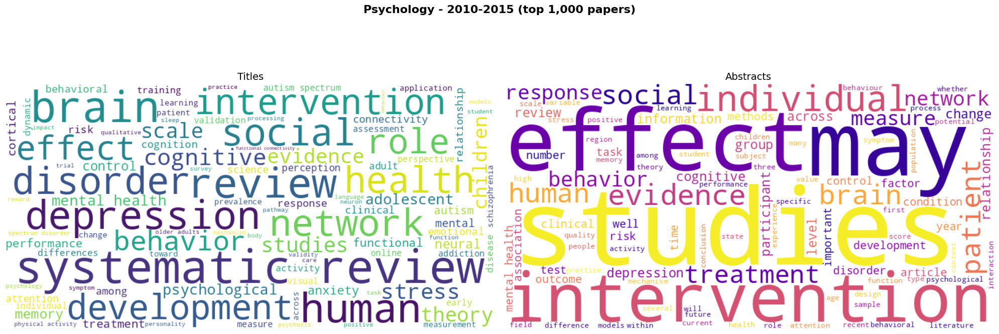

Processing Psychology - 2015-2020


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  Saved: viz/wordcloud_Psychology_2015-2020_top1000.png


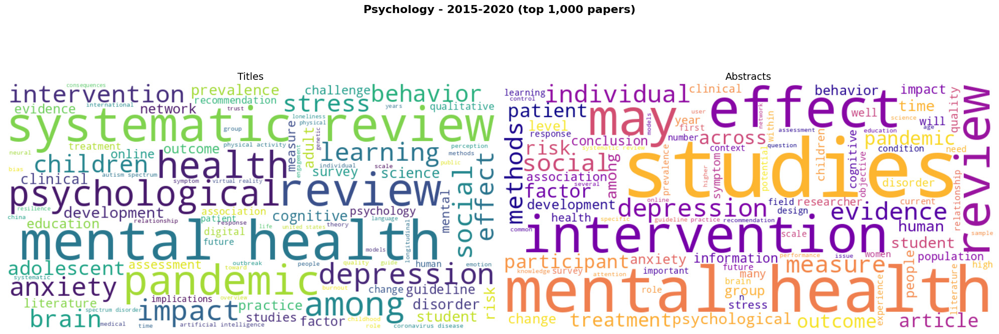

Processing Psychology - 2020-2025


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  Saved: viz/wordcloud_Psychology_2020-2025_top1000.png


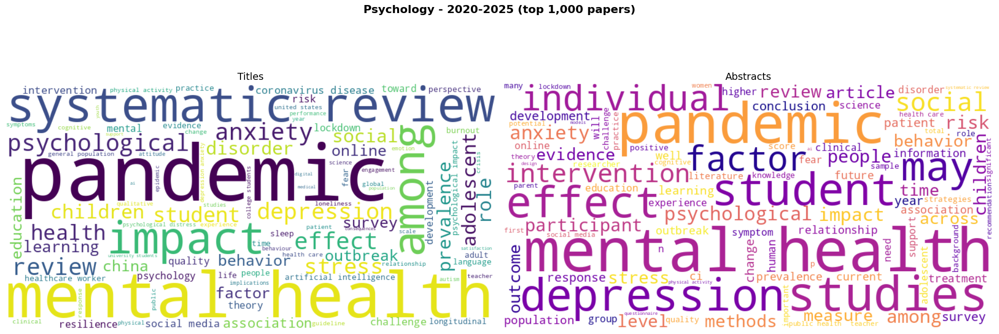

Processing Physics - 2000-2005


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  Saved: viz/wordcloud_Physics_2000-2005_top1000.png


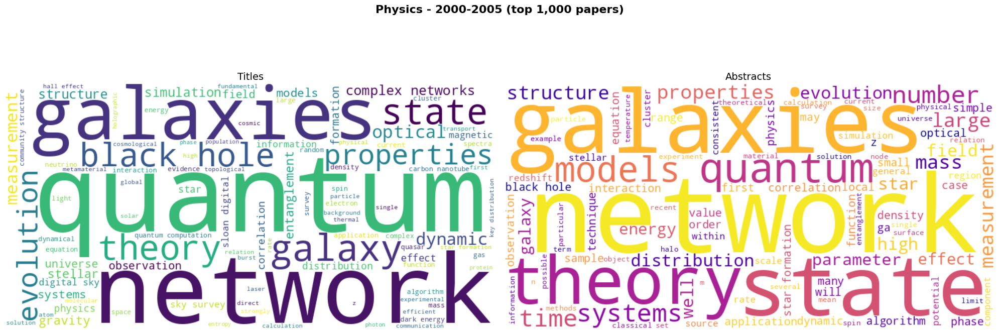

Processing Physics - 2005-2010


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  Saved: viz/wordcloud_Physics_2005-2010_top1000.png


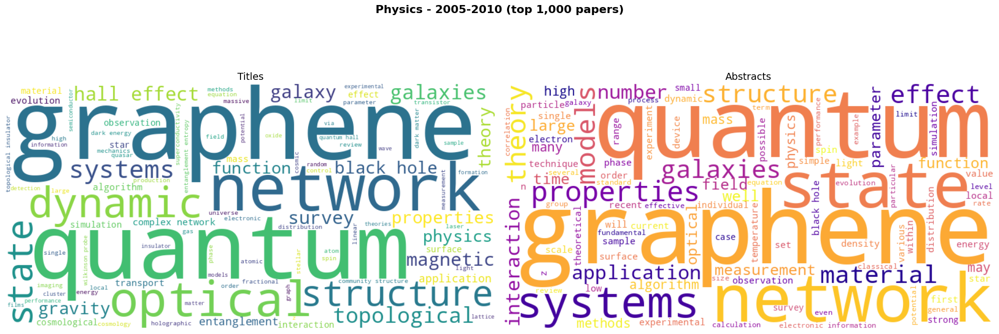

Processing Physics - 2010-2015


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  Saved: viz/wordcloud_Physics_2010-2015_top1000.png


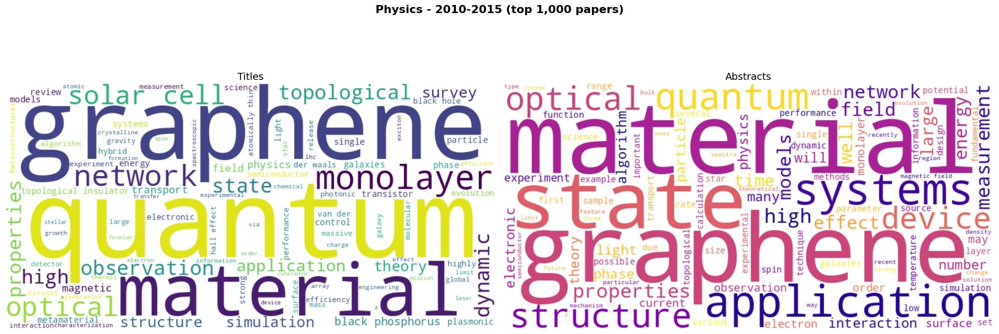

Processing Physics - 2015-2020


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  Saved: viz/wordcloud_Physics_2015-2020_top1000.png


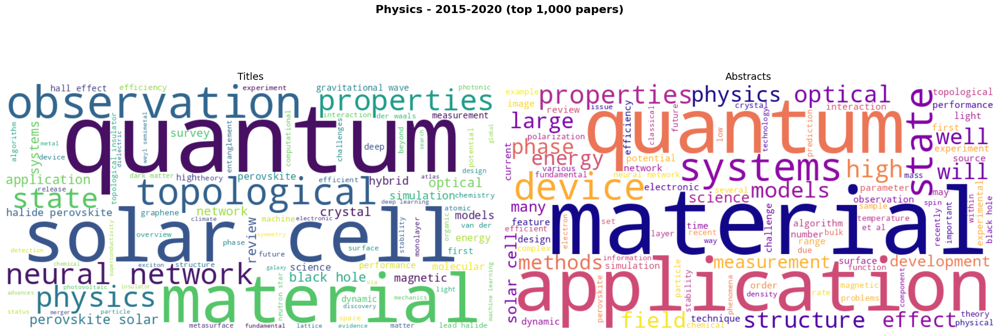

Processing Physics - 2020-2025


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

  Saved: viz/wordcloud_Physics_2020-2025_top1000.png


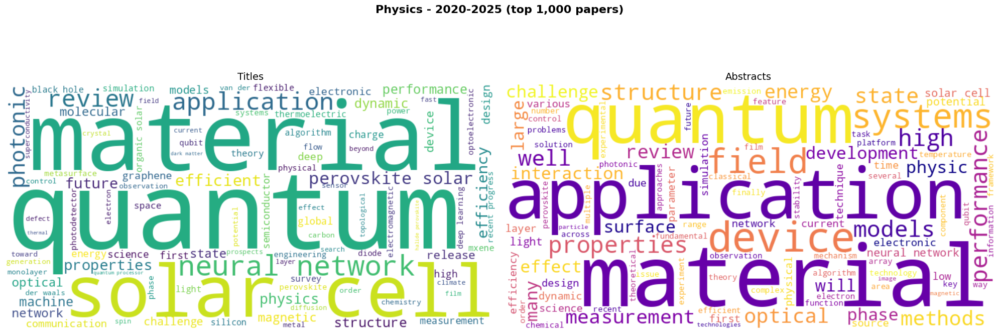


Wordcloud generation complete! All visualizations saved to viz/


In [ ]:
# create a visulations for wordclouds (title and abstract) for each field (CS, Psychology, Physics) for the decades years 2000-2005, 2005-2010,.... 2020-2025
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt
import re


# Define decades and fields
decades = [
    ('2000-2005', '2000-01-01', '2005-12-31'),
    ('2005-2010', '2005-01-01', '2010-12-31'),
    ('2010-2015', '2010-01-01', '2015-12-31'),
    ('2015-2020', '2015-01-01', '2020-12-31'),
    ('2020-2025', '2020-01-01', '2025-12-31')
]

fields = ['Computer Science', 'Psychology', 'Physics']

# Extended stopwords for academic papers
stopwords = set(STOPWORDS)
stopwords.update(['paper', 'study', 'research', 'method', 'result', 'approach', 'using', 'based', 
                  'propose', 'show', 'present', 'used', 'two', 'one', 'also', 'use', 'however',
                  'find', 'findings', 'data', 'work', 'model', 'new', 'different', 'analysis', 
                  'system', 'problem', 'results', 'proposed', 'develop', 'developed', 'provide',
                  ])

def clean_text(text):
    if not text:
        return ""
    
    # Tokenize
    tokens = word_tokenize(text.lower())
    
    # POS tagging
    pos_tags = pos_tag(tokens)
    
    # Keep only non-verb words (VB, VBD, VBG, VBN, VBP, VBZ are verb tags)
    verb_tags = {'VB', 'VBD', 'VBG', 'VBN', 'VBP', 'VBZ'}
    filtered_words = [word for word, pos in pos_tags if pos not in verb_tags and word.isalpha()]
    
    return ' '.join(filtered_words)

print("Fetching data for wordclouds...")
for field in fields:
    for decade_name, start_date, end_date in decades:
        print(f"Processing {field} - {decade_name}")
        top_k = 1000
        # Query to get concatenated titles and abstracts for this field/decade
        query = f"""
            WITH top_papers AS (
                SELECT *
                FROM papers_with_abstracts
                WHERE publication_date >= '{start_date}'
                AND publication_date <= '{end_date}'
                AND field_of_study LIKE '%{field}%'
                AND title IS NOT NULL
                AND abstract IS NOT NULL
                ORDER BY citation_count DESC
                LIMIT {top_k}
            )
            SELECT 
                string_agg(title, ' ') AS all_titles,
                string_agg(abstract, ' ') AS all_abstracts
            FROM top_papers;
        """
        
        result = merged_conn.execute(query).fetchone()
        
        if result:  # Check if we have papers
            all_titles = clean_text(result[0])
            all_abstracts = clean_text(result[1])
            # paper_count = result[2]
            
            # print(f"  Found {paper_count:,} papers")
            
            fig, axes = plt.subplots(1, 2, figsize=(20, 8))
            fig.suptitle(f'{field} - {decade_name} (top {top_k:,} papers)', fontsize=16, fontweight='bold')
            
            # Title wordcloud
            if all_titles:
                wc_title = WordCloud(width=800, height=400, background_color='white', 
                                    max_words=100, colormap='viridis', 
                                    stopwords=stopwords).generate(all_titles)
                axes[0].imshow(wc_title, interpolation='bilinear')
                axes[0].set_title('Titles', fontsize=14)
                axes[0].axis('off')
            
            # Abstract wordcloud
            if all_abstracts:
                wc_abstract = WordCloud(width=800, height=400, background_color='white',
                                       max_words=100, colormap='plasma',
                                       stopwords=stopwords).generate(all_abstracts)
                axes[1].imshow(wc_abstract, interpolation='bilinear')
                axes[1].set_title('Abstracts', fontsize=14)
                axes[1].axis('off')
            
            plt.tight_layout()
            
            # Save figure
            field_clean = field.replace(' ', '_')
            filename = f"{VIZ_DIR}/wordcloud_{field_clean}_{decade_name}_top{top_k}.png"
            plt.savefig(filename, dpi=300, bbox_inches='tight')
            print(f"  Saved: {filename}")
            
            plt.show()
            plt.close()
        else:
            print(f"  No papers found")

print(f"\nWordcloud generation complete! All visualizations saved to {VIZ_DIR}/")

## 7. Merge Wordcloud Images

Combine individual wordcloud images by field into single vertical composites for easier comparison across time periods.

In [ ]:
from PIL import Image
import re


# Regex pattern to extract field + years
pattern = re.compile(r"wordcloud_(.+?)_(\d{4}-\d{4})_top1000\.png")

# Group files by field
groups = {}

for fname in os.listdir(VIZ_DIR):
    match = pattern.match(fname)
    if not match:
        continue
    
    field, years = match.groups()
    groups.setdefault(field, []).append((years, os.path.join(VIZ_DIR, fname)))

# Sort and merge each group
for field, items in groups.items():
    # Sort by years (2000-2005, 2005-2010, etc.)
    items_sorted = sorted(items, key=lambda x: int(x[0].split('-')[0]))
    
    images = [Image.open(path) for _, path in items_sorted]
    
    # Determine final width = max width, height = sum of heights
    widths, heights = zip(*(img.size for img in images))
    final_width = max(widths)
    final_height = sum(heights)
    
    # Create new blank image
    merged = Image.new("RGB", (final_width, final_height))
    
    # Paste images vertically
    y_offset = 0
    for img in images:
        merged.paste(img, (0, y_offset))
        y_offset += img.height
    
    out_path = os.path.join(VIZ_DIR, f"{field}_wordcloud_merged.png")
    merged.save(out_path)
    
    print(f"Merged {len(images)} images for {field} → {out_path}")


Merged 5 images for Computer_Science → viz/Computer_Science_merged.png
Merged 5 images for Physics → viz/Physics_merged.png
Merged 5 images for Physics → viz/Physics_merged.png
Merged 5 images for Psychology → viz/Psychology_merged.png
Merged 5 images for Psychology → viz/Psychology_merged.png
